Training input shape: torch.Size([3, 128, 128])
Testing input shape: torch.Size([3, 128, 128])
First 5 preprocessed images from the training dataset:


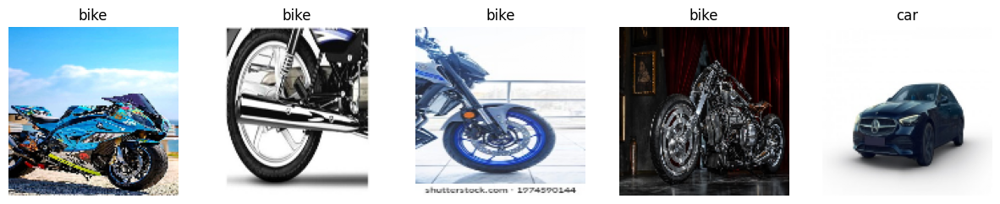

First 5 preprocessed images from the testing dataset:


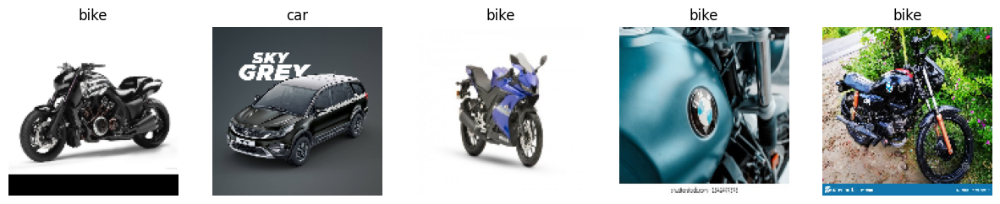

In [15]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt



# CLASS NAME 
class_names = ['car', 'bike']



# DEFINE A CUSTOM DATASET CLASS
class CustomDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None, target_size=(128, 128)):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        self.target_size = target_size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  

        
        
        # ENSURE ALL IMAGES HAVE THE SAME DIMENSIONS
        if image.shape[:2] != self.target_size:
            image = cv2.resize(image, self.target_size)

        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

    
    
    
#FUNCTION TO LOAD AND PREPROCESS IMAGE 
def load_and_preprocess_images(directory, label):
    images = []
    labels = []
    for filename in os.listdir(directory):
        if filename.endswith(".jpg"):
            file_path = os.path.join(directory, filename)
            images.append(file_path)
            labels.append(label)
    return images, labels



# DATA PATH
bike_image_dir = "/kaggle/input/car-vs-bike-classification-dataset/Car-Bike-Dataset/Bike"
car_image_dir = "/kaggle/input/car-vs-bike-classification-dataset/Car-Bike-Dataset/Car"



# LOAD AND PREPROCESS IMAGE DATA
bike_images, _ = load_and_preprocess_images(bike_image_dir, label=1)  # LABEL 1 TO BIKE 
car_images, _ = load_and_preprocess_images(car_image_dir, label=0)    # LABEL 0 TO CAR

# COMBINE ALL IMAGE AND LABEL
all_images = bike_images + car_images
all_labels = [1] * len(bike_images) + [0] * len(car_images)  # ASSIGN LABEL BASED ON CLASS NAME 

# CONVERT LABEL TO NUMERIC FORMAT
label_encoder = LabelEncoder()
numeric_labels = label_encoder.fit_transform(all_labels)

# SPLIT DATA INTO TRAINING AND TESTING SET 
X_train, X_test, y_train, y_test = train_test_split(all_images, numeric_labels, test_size=0.2, random_state=42)

# DEFINE TRANSFORMATION
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

# CREATE CUSTOM DATASET WITH SPECIFIED TARGET SIZE
train_dataset = CustomDataset(X_train, y_train, transform=transform, target_size=(128, 128))
test_dataset = CustomDataset(X_test, y_test, transform=transform, target_size=(128, 128))

# CREATE DATALOADERS
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)



#CHECK THE SHAPE OF TRAINING AND TESTING INPUT DATA 
print("Training input shape:", train_dataset[0][0].shape)
print("Testing input shape:", test_dataset[0][0].shape)



#SHOW 5 PREPROCESS IMAGE FROM TRAIN SET 
print("First 5 preprocessed images from the training dataset:")
fig, axs = plt.subplots(1, 5, figsize=(15, 3))
for i in range(5):
    image, label = train_dataset[i]
    axs[i].imshow(image.permute(1, 2, 0))  # CONVERT FROM TENSOR TO NUMPY ARRAY AND REARRANGE DIMENSION
    axs[i].set_title(class_names[label])  # SHOW CLASS NAME AS TITLE
    axs[i].axis('off')
plt.show()

# SHOW 5 PREPROCESS IMAGE FROM TEST SET 
print("First 5 preprocessed images from the testing dataset:")
fig, axs = plt.subplots(1, 5, figsize=(15, 3))
for i in range(5):
    image, label = test_dataset[i]
    axs[i].imshow(image.permute(1, 2, 0))  # CONVERT FROM TENSOR TO NUMPY ARRAY AND REARRANGE DIMENSION
    axs[i].set_title(class_names[label])  # SHOW CLASS NAME AS TITLE
    axs[i].axis('off')
plt.show()



Epoch [1/10], Loss: 0.5294
Epoch [2/10], Loss: 0.4894
Epoch [3/10], Loss: 0.4040
Epoch [4/10], Loss: 0.4163
Epoch [5/10], Loss: 0.4082
Epoch [6/10], Loss: 0.3109
Epoch [7/10], Loss: 0.2531
Epoch [8/10], Loss: 0.1854
Epoch [9/10], Loss: 0.1466
Epoch [10/10], Loss: 0.1388
Accuracy on test set: 87.23%


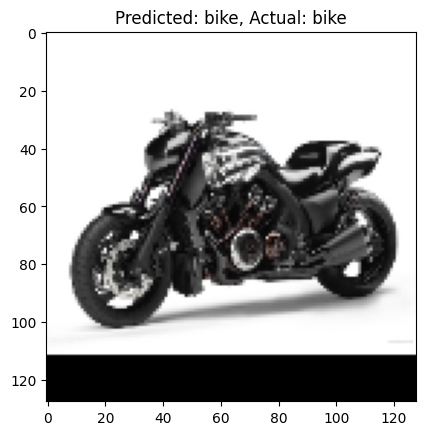

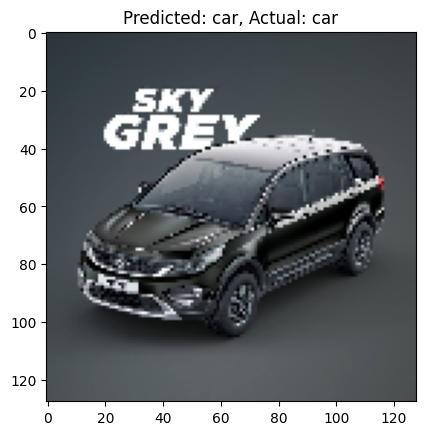

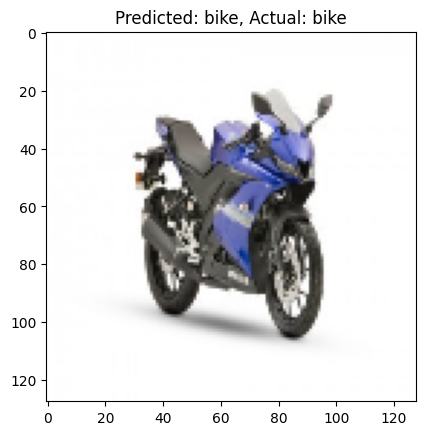

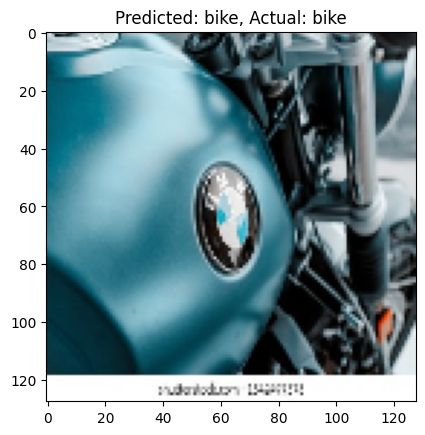

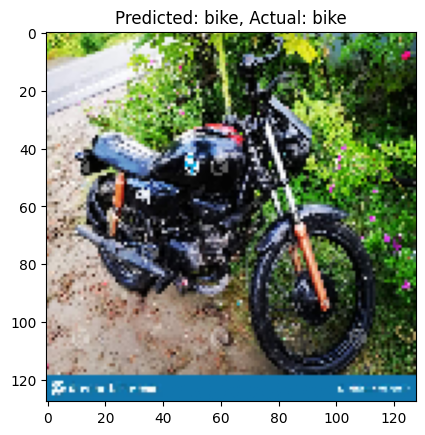

...

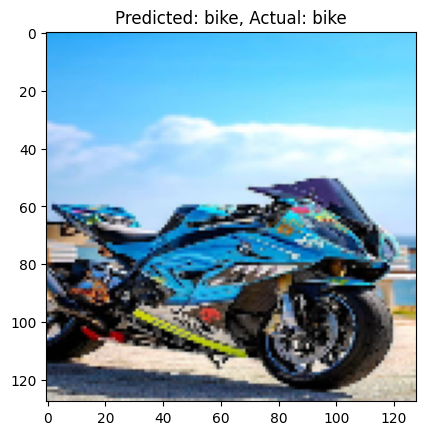

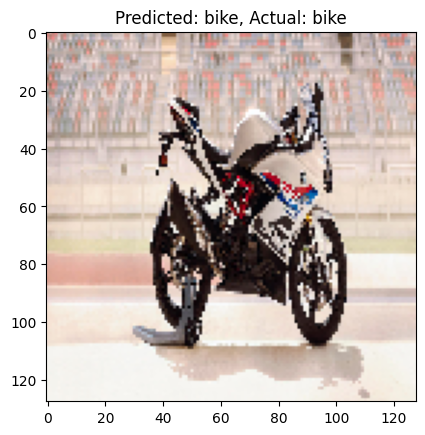

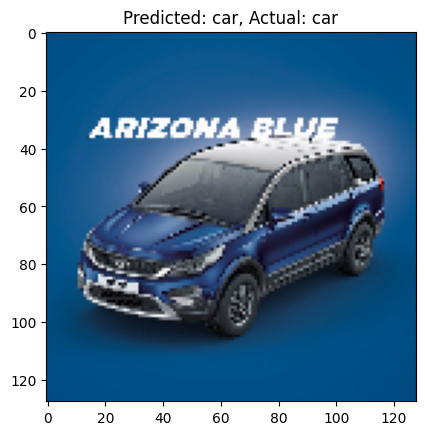

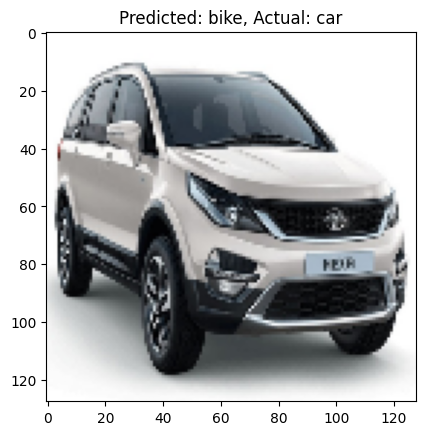

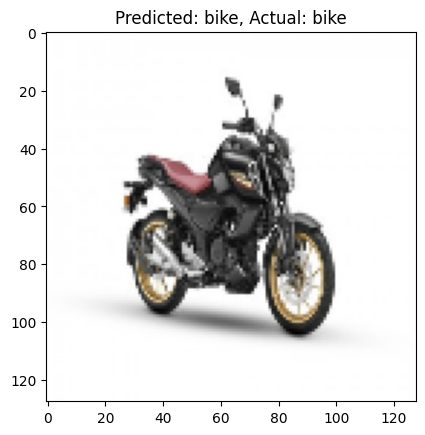

In [16]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt



# CLASS NAME 
class_names = ['car', 'bike']



# DEFINE A CUSTOM DATASET CLASS
class CustomDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None, target_size=(128, 128)):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        self.target_size = target_size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  

        
        
        # ENSURE ALL IMAGES HAVE THE SAME DIMENSIONS
        if image.shape[:2] != self.target_size:
            image = cv2.resize(image, self.target_size)

        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

    
    
    
#FUNCTION TO LOAD AND PREPROCESS IMAGE 
def load_and_preprocess_images(directory, label):
    images = []
    labels = []
    for filename in os.listdir(directory):
        if filename.endswith(".jpg"):
            file_path = os.path.join(directory, filename)
            images.append(file_path)
            labels.append(label)
    return images, labels



# DATA PATH
bike_image_dir = "/kaggle/input/car-vs-bike-classification-dataset/Car-Bike-Dataset/Bike"
car_image_dir = "/kaggle/input/car-vs-bike-classification-dataset/Car-Bike-Dataset/Car"



# LOAD AND PREPROCESS IMAGE DATA
bike_images, _ = load_and_preprocess_images(bike_image_dir, label=1)  # LABEL 1 TO BIKE
car_images, _ = load_and_preprocess_images(car_image_dir, label=0)    # LABEL 0 TO CAR

# COMBINE ALL IMAGE AND LABEL
all_images = bike_images + car_images
all_labels = [1] * len(bike_images) + [0] * len(car_images)  

# CONVERT LABEL TO NUMERIC FORMAT
label_encoder = LabelEncoder()
numeric_labels = label_encoder.fit_transform(all_labels)

# SPLIT DATA INTO TRAINING AND TESTING SET 
X_train, X_test, y_train, y_test = train_test_split(all_images, numeric_labels, test_size=0.2, random_state=42)

# DEFINE TRANSFORMATION
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

# CREATE CUSTOM DATASET WITH SPECIFIED TARGET SIZE
train_dataset = CustomDataset(X_train, y_train, transform=transform, target_size=(128, 128))
test_dataset = CustomDataset(X_test, y_test, transform=transform, target_size=(128, 128))

# CREATE DATALOADERS
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)




# BUILD CNN MODEL
class CNNModel(nn.Module):
    def __init__(self, num_classes=2):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.fc1 = nn.Linear(64 * 16 * 16, 512)
        self.fc2 = nn.Linear(512, num_classes)
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.maxpool(x)
        x = self.relu(self.conv2(x))
        x = self.maxpool(x)
        x = self.relu(self.conv3(x))
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

    
# INITIALIZE THE MODEL , LOSS FUNCTION, AND OPTIMIZER 
model = CNNModel()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# TRAIN THE MODEL
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
    epoch_loss = running_loss / len(train_dataset)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

# EVALUATE THE MODEL
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = correct / total
print(f"Accuracy on test set: {accuracy:.2%}")

# PREDICT AND PRINT RESULT 
model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        for i in range(len(images)):
            image = images[i].permute(1, 2, 0).numpy()  
            plt.imshow(image)
            plt.title(f"Predicted: {class_names[predicted[i].item()]}, Actual: {class_names[labels[i].item()]}")
            plt.show()  
